<a href="https://colab.research.google.com/github/Yuliia-K27/Final_project_PDS4/blob/main/Final_project16_07_2023.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Назва проекту: ***Розфарбовування чорно-білого зображення за допомогою нейронної мережі***.

Мета: Метою цього проекту є розробка та реалізація нейронної мережі для автоматичного розфарбовування чорно-білих зображень.

*В проекті показано як нейронна мережа може бути навчена на наборі зображень та використана для колоризації інших чорно-білих зображень.*

In [ ]:
import numpy as np
import os
from PIL import Image
import random
import tensorflow as tf
import keras
from matplotlib import pyplot as plt
import warnings


In [ ]:
warnings.filterwarnings("ignore")

In [ ]:
from keras.layers import Conv2D, UpSampling2D, InputLayer, Conv2DTranspose
from keras.layers import Activation, Dense, Dropout, Flatten
from keras.layers.normalization.batch_normalization import BatchNormalization
from keras.models import Sequential
from tensorflow.keras.utils import array_to_img, img_to_array, load_img
from skimage.color import rgb2lab, lab2rgb, rgb2gray, xyz2lab
from skimage.io import imsave
from google.colab import drive


In [ ]:
drive.mount('/content/gdrive')

Mounted at /content/gdrive


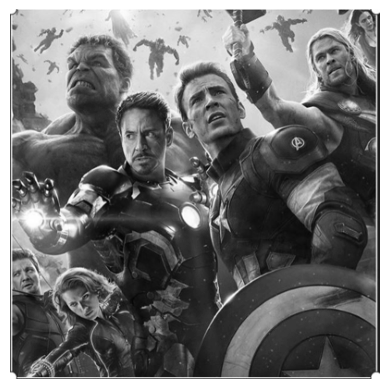

In [ ]:
# Завантаження та попередня обробка кольорового зображення
color_image = Image.open('/content/gdrive/MyDrive/Project/Yuliia44.JPG')
color_image = color_image.resize((400, 400))
color_image = np.array(color_image, dtype=float) / 255.0

# Перетворення кольорового зображення в чорно-біле
gray_image = color_image.mean(axis=2)

# Попередня обробка чорно-білого зображення
X = gray_image / 255.0

# Відображення чорно-білого зображення
plt.imshow(X, cmap='gray')
plt.axis('off')
plt.show()

Форма X: (1, 400, 400, 1)
Форма Y: (1, 400, 400, 2)
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, None, None, 8)     80        
                                                                 
 conv2d_1 (Conv2D)           (None, None, None, 8)     584       
                                                                 
 conv2d_2 (Conv2D)           (None, None, None, 16)    1168      
                                                                 
 conv2d_3 (Conv2D)           (None, None, None, 16)    2320      
                                                                 
 conv2d_4 (Conv2D)           (None, None, None, 32)    4640      
                                                                 
 conv2d_5 (Conv2D)           (None, None, None, 32)    9248      
                                                                 
 up_

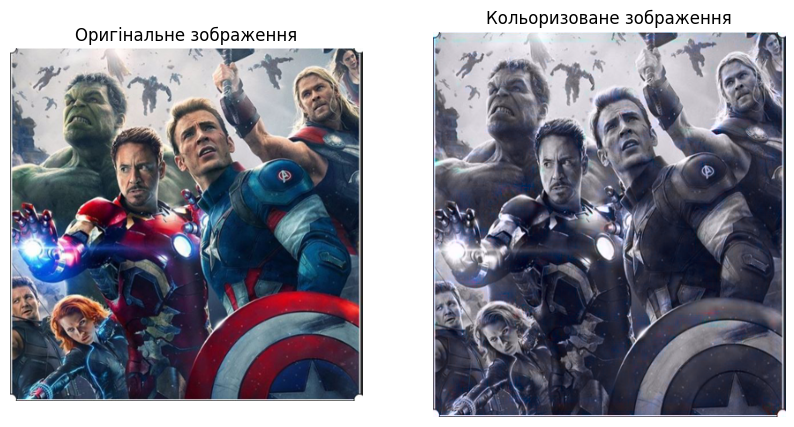

Форма X: (1, 400, 400, 1)
Форма Y: (1, 400, 400, 2)
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, None, None, 8)     80        
                                                                 
 conv2d_10 (Conv2D)          (None, None, None, 8)     584       
                                                                 
 conv2d_11 (Conv2D)          (None, None, None, 16)    1168      
                                                                 
 conv2d_12 (Conv2D)          (None, None, None, 16)    2320      
                                                                 
 conv2d_13 (Conv2D)          (None, None, None, 32)    4640      
                                                                 
 conv2d_14 (Conv2D)          (None, None, None, 32)    9248      
                                                                 
 u

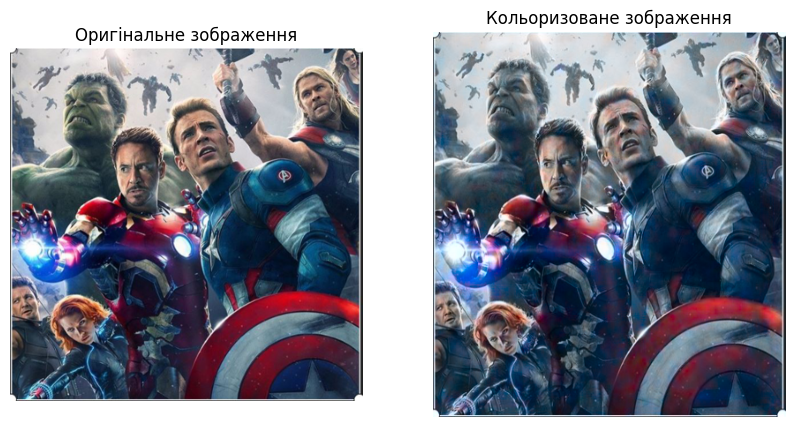

Форма X: (1, 400, 400, 1)
Форма Y: (1, 400, 400, 2)
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, None, None, 8)     80        
                                                                 
 conv2d_19 (Conv2D)          (None, None, None, 8)     584       
                                                                 
 conv2d_20 (Conv2D)          (None, None, None, 16)    1168      
                                                                 
 conv2d_21 (Conv2D)          (None, None, None, 16)    2320      
                                                                 
 conv2d_22 (Conv2D)          (None, None, None, 32)    4640      
                                                                 
 conv2d_23 (Conv2D)          (None, None, None, 32)    9248      
                                                                 
 u

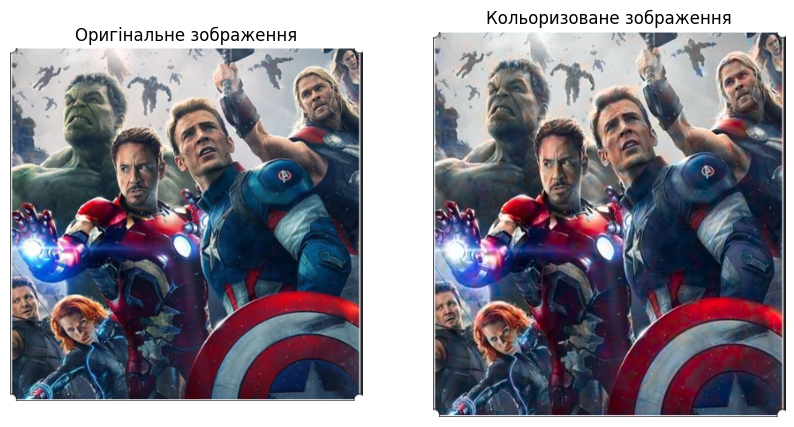

In [ ]:
# Функція для навчання моделі та генерації кольоризованих зображень
def train_and_colorize(image_path, epochs_list):
    # Завантаження та попередня обробка зображення
    image = Image.open(image_path)
    image = image.resize((400, 400))
    image = np.array(image, dtype=float) / 255.0
    X = rgb2lab(image)[:, :, 0]
    Y = rgb2lab(image)[:, :, 1:] / 128.0
    # Зміна форми масивів
    X = X.reshape(1, 400, 400, 1)
    Y = Y.reshape(1, 400, 400, 2)

    cur_list = []  # Створити пустий список

    for epochs in epochs_list:
        # Побудова нейромережі
        model = Sequential()
        model.add(InputLayer(input_shape=(None, None, 1)))
        model.add(Conv2D(8, (3, 3), activation='relu', padding='same', strides=2))
        model.add(Conv2D(8, (3, 3), activation='relu', padding='same'))
        model.add(Conv2D(16, (3, 3), activation='relu', padding='same'))
        model.add(Conv2D(16, (3, 3), activation='relu', padding='same', strides=2))
        model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
        model.add(Conv2D(32, (3, 3), activation='relu', padding='same', strides=2))
        model.add(UpSampling2D((2, 2)))
        model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
        model.add(UpSampling2D((2, 2)))
        model.add(Conv2D(16, (3, 3), activation='relu', padding='same'))
        model.add(UpSampling2D((2, 2)))
        model.add(Conv2D(2, (3, 3), activation='tanh', padding='same'))

        # Виведення форм масивів для перевірки
        print('Форма X:', X.shape)
        print('Форма Y:', Y.shape)

        # Компіляція та навчання моделі
        model.compile(optimizer='rmsprop', loss='mse')
        print(model.summary())
        model.fit(x=X, y=Y, batch_size=1, epochs=epochs)

        # Кольоризація зображень
        output = model.predict(X)
        output *= 128
        output = output.reshape((400, 400, 2))
        cur = np.zeros((400, 400, 3))
        cur[:, :, 0] = X[0][:, :, 0]
        cur[:, :, 1:] = output

        # Перетворення з простору кольорів Lab у RGB
        result = lab2rgb(cur)

        # Додати кольоризоване зображення до списку
        cur_list.append(result)

        # Відображення оригінального та кольоризованого зображень
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        axes[0].imshow(image)
        axes[0].set_title('Оригінальне зображення')
        axes[0].axis('off')
        axes[1].imshow(result, aspect='auto')
        axes[1].set_title('Кольоризоване зображення')
        axes[1].axis('off')
        plt.show()

    # Повернути список кольоризованих зображень
    return cur_list


# Вказівка шляху до зображення
image_path = '/content/gdrive/MyDrive/Project/Yuliia44.JPG'

# Вказівка епох для порівняння
epochs_list = [100, 500, 1000]

# Виклик функції для навчання моделі та кольоризації зображення з різною кількістю епох
colorized_images = train_and_colorize(image_path, epochs_list)

# Збереження кольоризованих зображень
for i, epochs in enumerate(epochs_list):
    cur_image_path = f'/content/gdrive/MyDrive/Project/img_result_{epochs}_epoch.png'
    imsave(cur_image_path, colorized_images[i])


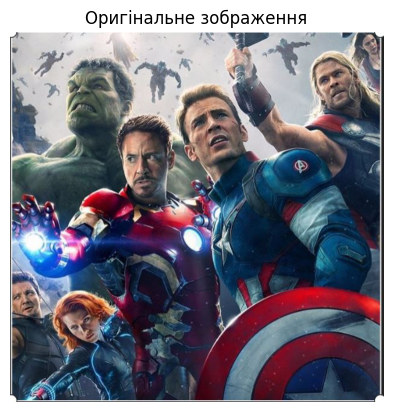

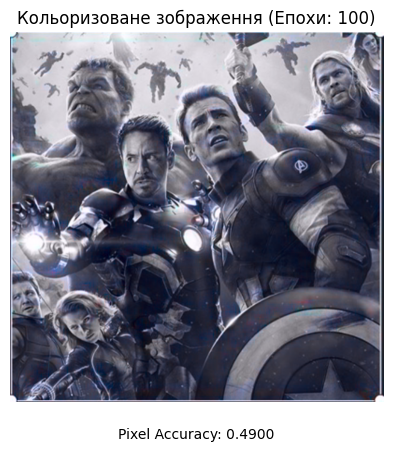

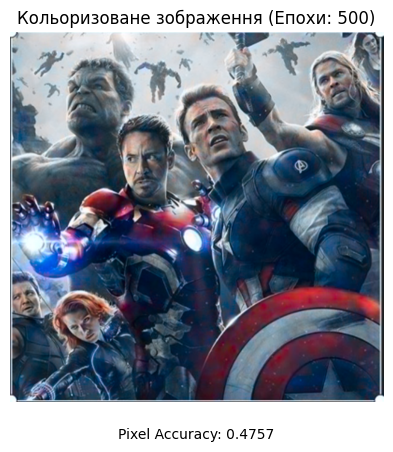

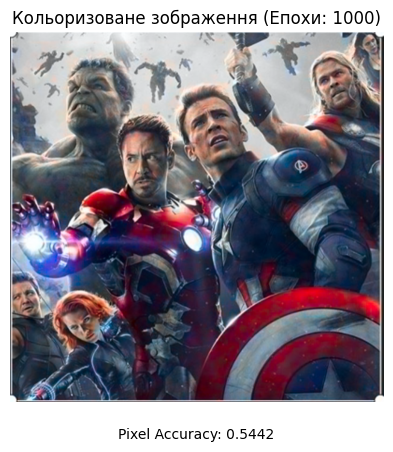

In [ ]:
from PIL import Image

# Розрахунок піксельної точності
def calculate_pixel_accuracy(original_array, colorized_array):
    # Розрахунок піксельної точності на основі оригінального та кольоризованого зображень
    diff = np.abs(original_array - colorized_array)
    accuracy = 1.0 - np.mean(diff / 255.0)
    return accuracy

# Зчитування оригінального зображення
original_image = np.array(Image.open('/content/gdrive/MyDrive/Project/Yuliia44.JPG'))

# Відображення оригінального зображення
plt.imshow(original_image)
plt.title('Оригінальне зображення')
plt.axis('off')
plt.show()

# Перебір епох і відображення кольоризованих зображень
for i, epochs in enumerate(epochs_list):
    cur_image_path = f'/content/gdrive/MyDrive/Project/img_result_{epochs}_epoch.png'
    cur_image = Image.open(cur_image_path)

    # Зміна розміру кольоризованого зображення
    cur_image = cur_image.resize((original_image.shape[1], original_image.shape[0]))
    cur_image = np.array(cur_image)

    # Відображення кольоризованого зображення
    plt.imshow(cur_image)
    plt.title(f'Кольоризоване зображення (Епохи: {epochs})')
    plt.axis('off')

    # Розрахунок піксельної точності
    accuracy = calculate_pixel_accuracy(original_image, cur_image)
    plt.text(0.5, -0.1, f'Pixel Accuracy: {accuracy:.4f}', ha='center', transform=plt.gca().transAxes)

    plt.show()


Для побудови нейромережі, яка вміє розфарбовувати чорно-білі зображення, використаю архітектуру з енкодером, ф'южн-шаром і декодером. Основною частиною буде Inception ResNet v2, яку використовуємо як енкодер для видобуття характеристик з вхідного зображення.

Інтерпретація Inception ResNet v2 як енкодера означає, що візьмемо всі шари цієї нейромережі, включаючи згорткові та пулінгові шари, та використовуватимемо їх для отримання більш абстрактних представлень зображення. Ці представлення будуть передані нашому ф'южн-шару, який об'єднує інформацію від енкодера з декодером.

Декодер буде відповідальним за розфарбовування зображення. Він може складатися з деконволюційних шарів або транспонованих сверток, які розширюють розмірність представлення, отриманого з ф'южн-шару, з метою відновлення повноцінного кольорового зображення. Остаточний результат можна отримати, наприклад, за допомогою функції активації Sigmoid, яка обмежує вихідні значення у діапазоні [0, 1] для кожного пікселя.

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input
from tensorflow.keras.layers import Conv2D, UpSampling2D, InputLayer, Conv2DTranspose, Input, Reshape, concatenate
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.callbacks import TensorBoard
from skimage.color import rgb2lab, lab2rgb, rgb2gray, gray2rgb
from skimage.transform import resize
from skimage.io import imsave

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
# Створення папки для результатів
results_folder = '/content/gdrive/MyDrive/Project/results1'
if not os.path.exists(results_folder):
    os.makedirs(results_folder)

In [ ]:
# Завантаження зображень для навчання
X = []
for filename in os.listdir('/content/gdrive/MyDrive/Project/color_images'):
    img = load_img('/content/gdrive/MyDrive/Project/color_images/' + filename)
    img = img.resize((256, 256))  # Зміна форми зображення
    X.append(img_to_array(img))
X = np.array(X, dtype=float)


In [ ]:
# Нормалізація даних
Xtrain = X * (1.0 / 255)

# Завантаження ваг моделі Inception ResNet v2
inception = tf.keras.applications.InceptionResNetV2(weights='imagenet', include_top=True)

inception.graph = tf.compat.v1.get_default_graph()

# Вхідні дані для енкодера
encoder_input = Input(shape=(256, 256, 1), name='encoder_input')
encoder_output = Conv2D(64, (3, 3), activation='relu', padding='same', strides=2)(encoder_input)
encoder_output = Conv2D(128, (3, 3), activation='relu', padding='same')(encoder_output)
encoder_output = Conv2D(128, (3, 3), activation='relu', padding='same', strides=2)(encoder_output)
encoder_output = Conv2D(256, (3, 3), activation='relu', padding='same')(encoder_output)
encoder_output = Conv2D(256, (3, 3), activation='relu', padding='same', strides=2)(encoder_output)
encoder_output = Conv2D(512, (3, 3), activation='relu', padding='same')(encoder_output)
encoder_output = Conv2D(512, (3, 3), activation='relu', padding='same')(encoder_output)
encoder_output = Conv2D(256, (3, 3), activation='relu', padding='same')(encoder_output)

Instructions for updating:
Colocations handled automatically by placer.


In [ ]:
# Ф'южн-шар
fusion_input = Input(shape=(1000,), name='fusion_input')
fusion_output = Reshape((1, 1, 1000))(fusion_input)
fusion_output = UpSampling2D((32, 32))(fusion_output)
fusion_output = concatenate([encoder_output, fusion_output], axis=3)
fusion_output = Conv2D(256, (1, 1), activation='relu', padding='same')(fusion_output)

In [ ]:
# Декодер
decoder_output = Conv2D(128, (3, 3), activation='relu', padding='same')(fusion_output)
decoder_output = UpSampling2D((2, 2))(decoder_output)
decoder_output = Conv2D(64, (3, 3), activation='relu', padding='same')(decoder_output)
decoder_output = UpSampling2D((2, 2))(decoder_output)
decoder_output = Conv2D(32, (3, 3), activation='relu', padding='same')(decoder_output)
decoder_output = Conv2D(16, (3, 3), activation='relu', padding='same')(decoder_output)
decoder_output = Conv2D(2, (3, 3), activation='tanh', padding='same')(decoder_output)
decoder_output = UpSampling2D((2, 2))(decoder_output)

In [ ]:
# Побудова моделі
model = Model(inputs=[encoder_input, fusion_input], outputs=decoder_output)
tf.compat.v1.disable_eager_execution()
print(model.summary())


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 encoder_input (InputLayer)     [(None, 256, 256, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_420 (Conv2D)            (None, 128, 128, 64  640         ['encoder_input[0][0]']          
                                )                                                                 
                                                                                                  
 conv2d_421 (Conv2D)            (None, 128, 128, 12  73856       ['conv2d_420[0][0]']             
                                8)                                                          

In [ ]:
# Генерація вкладень Inception для чорно-білих зображень
def create_inception_embedding(grayscaled_rgb):
    grayscaled_rgb_resized = []
    for i in grayscaled_rgb:
        i = resize(i, (299, 299, 3), mode='constant')
        grayscaled_rgb_resized.append(i)
    grayscaled_rgb_resized = np.array(grayscaled_rgb_resized)
    grayscaled_rgb_resized = preprocess_input(grayscaled_rgb_resized)

    with tf.compat.v1.Session(graph=inception.graph) as sess:
        sess.run(tf.compat.v1.global_variables_initializer())
        sess.run(tf.compat.v1.tables_initializer())
        embed = sess.run(inception.outputs[0], feed_dict={inception.input: grayscaled_rgb_resized})

    return embed



In [ ]:
# Підготовка даних для навчання
datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    shear_range=0.2,
    zoom_range=0.2,
    rotation_range=20,
    horizontal_flip=True)

batch_size = 10

def image_a_b_gen(batch_size):
    for batch in datagen.flow(Xtrain, batch_size=batch_size):
        grayscaled_rgb = gray2rgb(rgb2gray(batch))
        embed = create_inception_embedding(grayscaled_rgb)
        lab_batch = rgb2lab(batch)
        X_batch = lab_batch[:, :, :, 0]
        X_batch = X_batch.reshape(X_batch.shape + (1,))
        Y_batch = lab_batch[:, :, :, 1:] / 128
        yield ([X_batch, embed], Y_batch)

In [29]:
# Навчання моделі
tensorboard = TensorBoard(log_dir='/content/gdrive/MyDrive/Project/results1/')

model.compile(optimizer='adam', loss='mse')
model.fit(image_a_b_gen(batch_size), callbacks=[tensorboard], epochs=10, steps_per_epoch=2)


Epoch 1/10


AttributeError: ignored

In [ ]:
# Створення папки для результатів
results_folder = '/content/gdrive/MyDrive/Project/result_bw/'
if not os.path.exists(results_folder):
    os.makedirs(results_folder)

In [ ]:
# Передбачення на нових зображеннях
color_me = []
for filename in os.listdir('/content/gdrive/MyDrive/Project/black_images/'):
    img = load_img('/content/gdrive/MyDrive/Project/black_images/' + filename)
    img = img.resize((256, 256))  # Зміна розміру зображення
    color_me.append(img_to_array(img))

color_me = np.array(color_me, dtype=float)
gray_me = gray2rgb(rgb2gray(1.0 / 255 * color_me))
color_me_embed = create_inception_embedding(gray_me)
color_me = rgb2lab(1.0 / 255 * color_me)[:, :, :, 0]
color_me = color_me.reshape(color_me.shape + (1,))
output = model.predict([color_me, color_me_embed], steps=len(color_me))
output = output * 128

# Збереження розфарбованих зображень
for i in range(len(color_me)):
    cur = np.zeros((256, 256, 3))
    cur[:, :, 0] = color_me[i][:, :, 0]
    cur[:, :, 1:] = output[i]
    imsave(results_folder + "result_{}.png".format(i), lab2rgb(cur))

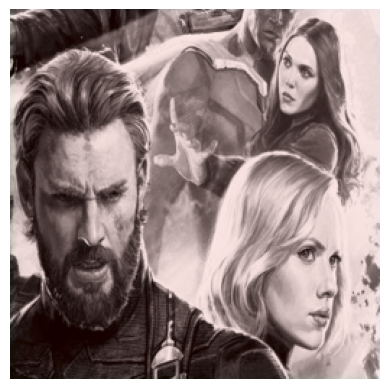

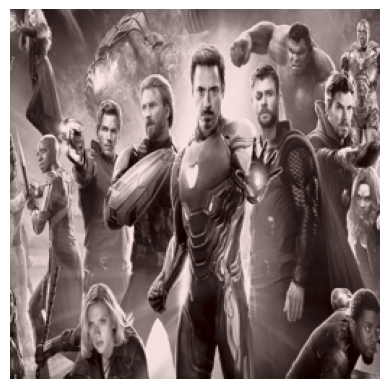

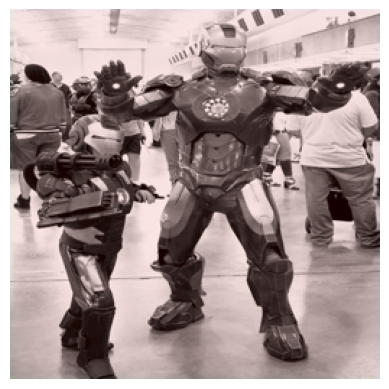

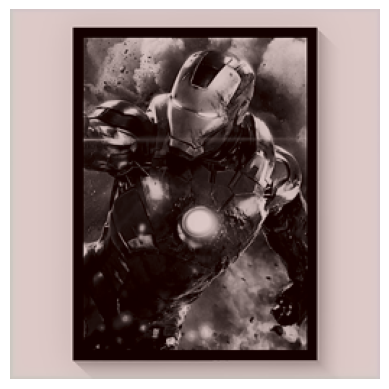

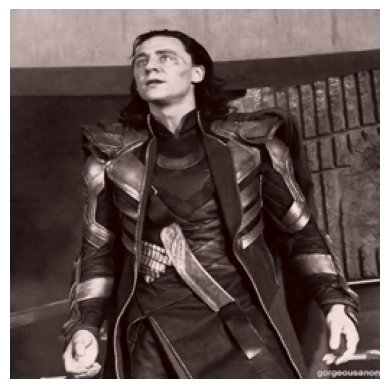

...

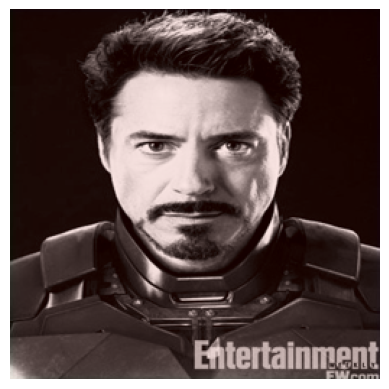

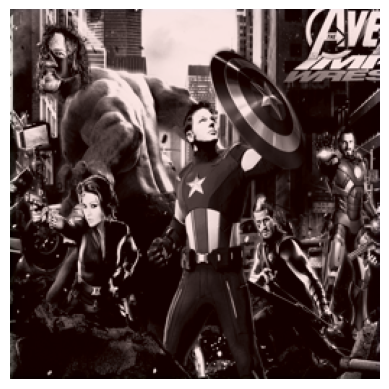

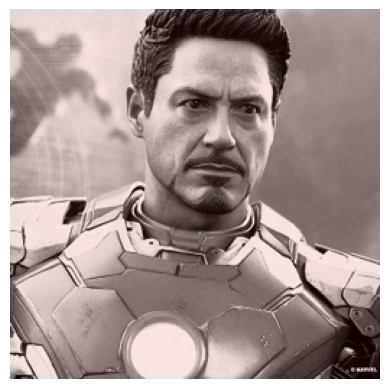

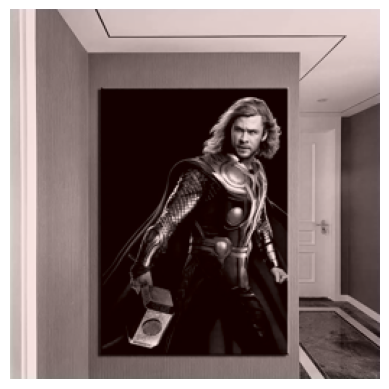

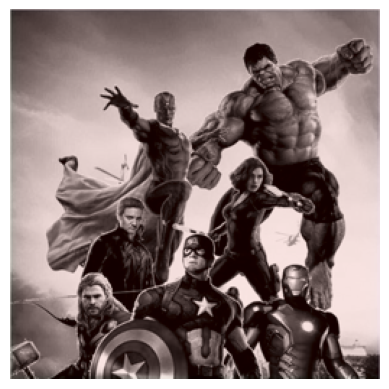

In [ ]:
import matplotlib.pyplot as plt

# Завантаження та відображення розфарбованих зображень
for i in range(len(color_me)):
    cur = np.zeros((256, 256, 3))
    cur[:, :, 0] = color_me[i][:, :, 0]
    cur[:, :, 1:] = output[i]

    # Конвертація зображення з формату Lab в RGB
    cur_rgb = lab2rgb(cur)

    # Відображення зображення
    plt.imshow(cur_rgb)
    plt.axis('off')
    plt.show()

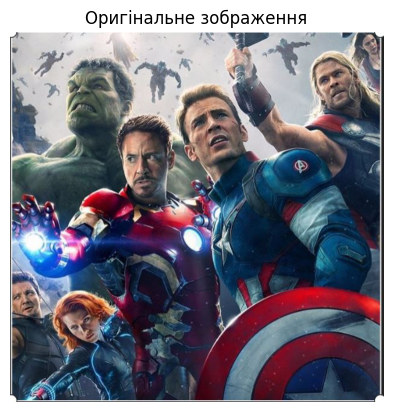

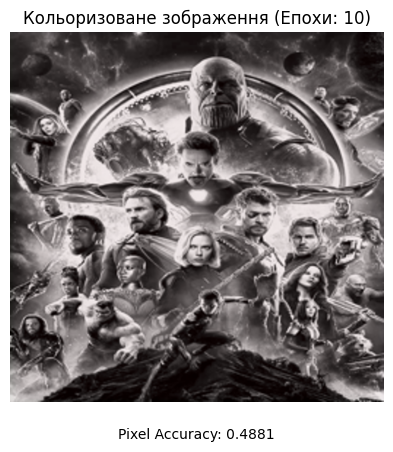

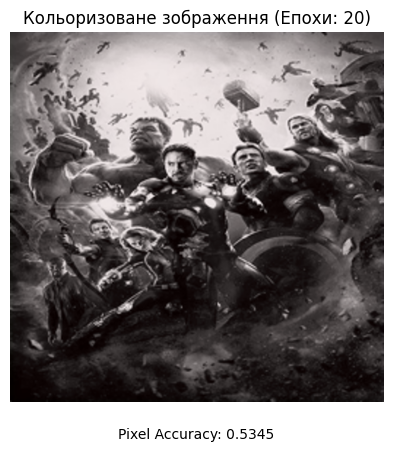

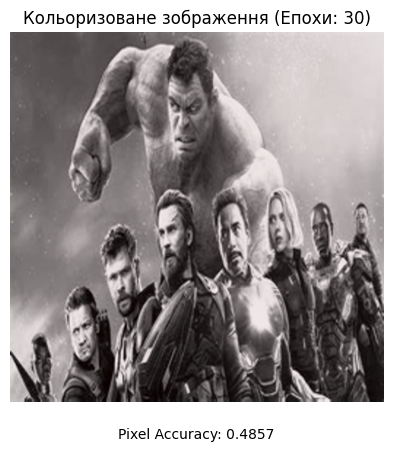

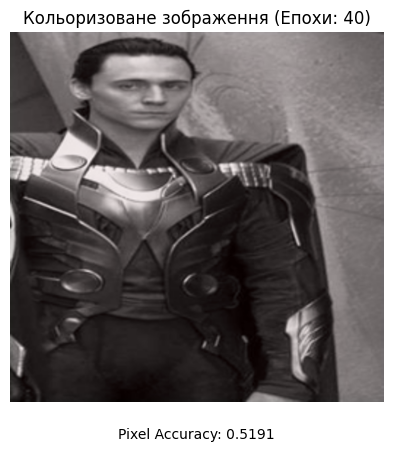

In [30]:
from PIL import Image

# Розрахунок піксельної точності
def calculate_pixel_accuracy(original_array, colorized_array):
    # Розрахунок піксельної точності на основі оригінального та кольоризованого зображень
    diff = np.abs(original_array - colorized_array)
    accuracy = 1.0 - np.mean(diff / 255.0)
    return accuracy

# Зчитування оригінального зображення
original_image = np.array(Image.open('/content/gdrive/MyDrive/Project/Yuliia44.JPG'))

# Відображення оригінального зображення
plt.imshow(original_image)
plt.title('Оригінальне зображення')
plt.axis('off')
plt.show()

epochs_list = [10, 20, 30, 40]  # Список епох, для яких відображати кольоризовані зображення

# Перебір епох і відображення кольоризованих зображень
for i, epochs in enumerate(epochs_list):
    cur_image_path = f'/content/gdrive/MyDrive/Project/result_bw/result_{epochs}.png'
    cur_image = Image.open(cur_image_path)

    # Зміна розміру кольоризованого зображення
    cur_image = cur_image.resize((original_image.shape[1], original_image.shape[0]))
    cur_image = np.array(cur_image)

    # Відображення кольоризованого зображення
    plt.imshow(cur_image)
    plt.title(f'Кольоризоване зображення (Епохи: {epochs})')
    plt.axis('off')

    # Розрахунок піксельної точності
    accuracy = calculate_pixel_accuracy(original_image, cur_image)
    plt.text(0.5, -0.1, f'Pixel Accuracy: {accuracy:.4f}', ha='center', transform=plt.gca().transAxes)

    plt.show()

